# Image Stitching with Harris Corner Detection 
#### Yash Wakde 

## Import Necessary Libraries

In [1]:
# Cell 1: Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


## Function to Load Images from a Directory
#### The load_images function loads all images from a specified directory, converts them to RGB (for correct color display with Matplotlib), and displays the images in a single row. It returns a list of the loaded images.



In [2]:
# Cell 2: Function to load images from a directory
def load_images(path):
    """
    Load images from file paths and convert to RGB.
    """
    images = [cv2.imread(os.path.join(path, file)) for file in sorted(os.listdir(path))]
    images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images if img is not None]

    print("Images loaded successfully!")
    
    fig, axs = plt.subplots(1, len(images), figsize=(24, 8))
    for i in range(len(images)):
        axs[i].imshow(images[i])
        axs[i].set_title(f'Image {i+1}')
        axs[i].axis('off')
    plt.show()
    return images


## Function to Detect Keypoints and Compute Descriptors 
### The function detects keypoints using the Harris corner detector (harris_detector function). Harris identifies stable points (corners) in the image based on intensity gradients.Once the Harris keypoints are detected, the code then computes SIFT descriptors based on these Harris-detected keypoints in the detect_and_compute_keypoints function.SIFT descriptors are calculated specifically at the locations of Harris keypoints rather than finding new keypoints. This means SIFT is only used for descriptor extraction, not for detecting keypoints.


In [3]:
# Cell 3: Function to detect and compute keypoints using Harris and SIFT
def harris_detector(img, blockSize=3, ksize=25, k=0.05):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float32)
    
    # Calculate gradients
    Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    
    # Calculate products of gradients
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    # Apply Gaussian filtering
    Sxx = cv2.GaussianBlur(Ixx, (blockSize, blockSize), 0)
    Syy = cv2.GaussianBlur(Iyy, (blockSize, blockSize), 0)
    Sxy = cv2.GaussianBlur(Ixy, (blockSize, blockSize), 0)

    # Compute Harris response
    harris_response = (Sxx * Syy - Sxy ** 2) - k * ((Sxx + Syy) ** 2)

    # Threshold response and find keypoints
    threshold = 0.005 * harris_response.max()
    keypoints = [cv2.KeyPoint(float(x), float(y), 1) for y, x in zip(*np.where(harris_response > threshold))]
    
    return keypoints

def detect_and_compute_keypoints(img):
    harris_keypoints = harris_detector(img)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.compute(img, harris_keypoints)
    return keypoints, descriptors


## Function to Match Features Using BFMatcher and Ratio Test
### The match_features function finds matching features between two sets of descriptors using the BFMatcher (Brute Force Matcher). A ratio test is applied to filter out poor matches, leaving only good matches which are then sorted by distance for accuracy.

In [4]:
# Cell 4: Function to match features using BFMatcher and ratio test
def match_features(des1, des2):
    """
    Match features between two sets of descriptors using BFMatcher with L2 norm and knnMatch.
    """
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.5 * n.distance]
    return sorted(good_matches, key=lambda x: x.distance)


## Function to Draw Matches Between Two Images
### The draw_matches function visualizes the top num_matches matches between two images, which helps in verifying the quality and accuracy of feature matching between images.

In [5]:
# Cell 5: Function to draw matches between two images
def draw_matches(img1, img2, kp1, kp2, matches, num_matches=100):
    """
    Draw the top N feature matches between two images.
    """
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:num_matches], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(12, 6))
    plt.imshow(img_matches)
    plt.title("Top Feature Matches")
    plt.show()


## Function to Warp Image with Padding to Fit Fully within the Frame
### The warpPerspectivePadded function applies a perspective warp to align one image with another using a homography matrix, with added padding to ensure the transformed image fits within the frame without cropping.

In [6]:
# Cell 6: Function to warp image with padding to fit fully within the frame
def warpPerspectivePadded(src, dst, H, flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0):
    """
    Warp perspective with padding to fit transformed image fully within frame.
    """
    src_h, src_w = src.shape[:2]
    lin_homg_pts = np.array([[0, src_w, src_w, 0], [0, 0, src_h, src_h], [1, 1, 1, 1]])
    transf_lin_homg_pts = H.dot(lin_homg_pts)
    transf_lin_homg_pts /= transf_lin_homg_pts[2, :]
    min_x, min_y = np.floor(np.min(transf_lin_homg_pts[0])).astype(int), np.floor(np.min(transf_lin_homg_pts[1])).astype(int)
    max_x, max_y = np.ceil(np.max(transf_lin_homg_pts[0])).astype(int), np.ceil(np.max(transf_lin_homg_pts[1])).astype(int)
    anchor_x, anchor_y = max(0, -min_x), max(0, -min_y)
    dst_h, dst_w = max(max_y, dst.shape[0]) + anchor_y, max(max_x, dst.shape[1]) + anchor_x
    transl_transf = np.eye(3, 3)
    transl_transf[0, 2], transl_transf[1, 2] = anchor_x, anchor_y
    shifted_transf = transl_transf.dot(H)
    dst_padded = cv2.copyMakeBorder(dst, anchor_y, dst_h - dst.shape[0] - anchor_y, anchor_x, dst_w - dst.shape[1] - anchor_x, borderType=borderMode, value=borderValue)
    src_warped = cv2.warpPerspective(src, shifted_transf, (dst_w, dst_h), flags=flags, borderMode=borderMode, borderValue=borderValue)
    return dst_padded, src_warped


## Function to Blend Two Images Using Alpha Blending
### The masking function blends two overlapping images using alpha blending, handling any black areas that may appear at the edges. This helps reduce visible seams in the final panorama.

In [7]:
# Cell 7: Function to blend two images using alpha blending
def masking(bot, top, alpha=0.5):
    """
    Blend top and bottom images with alpha blending, handling black areas with masking.
    """
    topmask, botmask = cv2.inRange(top, 0, 0), cv2.inRange(bot, 0, 0)
    mask_bot, mask_top = (botmask != 255) & (topmask == 255), (topmask != 255) & (botmask == 255)
    blend = cv2.addWeighted(top, alpha, bot, 1 - alpha, 0.0)
    blend[mask_bot] = bot[mask_bot]
    blend[mask_top] = top[mask_top]
    return blend


## Function to Stitch Two Images Based on Matched Keypoints and Homography
### The stitch_images function stitches two images together by calculating a homography matrix based on the matched keypoints. It then warps and blends the images, creating a seamless transition between them.

In [8]:
# Cell 8: Function to stitch two images based on matched keypoints and homography
def stitch_images(img1, img2, kp1, kp2, matches):
    """
    Stitch two images together using matched keypoints and RANSAC to find homography.
    Adds padding based on detected alignment.
    """
    # Extract matched keypoints
    img1_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img2_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # Compute homography matrix using RANSAC
    H, mask = cv2.findHomography(img1_pts, img2_pts, cv2.RANSAC, 5.0)
    
    # Warp img1 onto img2's perspective with padding
    img1_warped, img2_padded = warpPerspectivePadded(img1, img2, H)
    
    # Blend images with alpha masking to reduce visible seams
    stitched_image = masking(img1_warped, img2_padded, alpha=0.5)
    
    return np.uint8(stitched_image)


## Function to Create Panorama from a List of Images
### The create_panorama function sequentially stitches a list of images into a panorama. It processes each pair of consecutive images, matches features, optionally visualizes matches, and stitches them until the final panorama is complete.

In [9]:
# Cell 9: Function to create panorama from a list of images
def create_panorama(images):
    """
    Create a panorama from a list of images.
    """
    stitched_image = images[0]  # Start with the first image
    
    for i in range(1, len(images)):
        print(f"Stitching image {i-1} and {i}...")
        
        # Detect and compute keypoints and descriptors
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])
        
        # Match features
        matches = match_features(descriptors1, descriptors2)
        print(f"Number of good matches between images: {len(matches)}")

        # Optional: Displaying matches for visualization
        draw_matches(stitched_image, images[i], keypoints1, keypoints2, matches, num_matches=100)
        
        # Stitch the current pair of images
        stitched_image = stitch_images(stitched_image, images[i], keypoints1, keypoints2, matches)
    
    return stitched_image


## Analysis 
#### Below are the outputs of image sets below 
 ##### - Mural on wall with 50 percent overlap 
 ##### - Cinder block wall with 50 percent overlap
 ##### - Mural on wall with 15 percent overlap 

       

## Analysis Datase-1 of Mural on wall with 50 percent overlap 
#### The stitched panorama for Dataset 1 effectively captures the mural's patterns and colors, with good alignment in most areas. However, slight distortions and vertical misalignments appear , especially near the top, likely due to varying camera angles or heights. Visible seams suggest that alpha blending alone may not be sufficient for smooth transitions. Feature matching generally worked well, the features of the mural accurately matches this all is done by changing and varying diff parameters.Also there are many transormation losses there fore we can see the images boundries where they are stiched from  

### Feature Matching: Dataset 1 shows high numbers of good matches between consecutive images, with match counts reaching up to 1631. This high match count indicates a strong overlap and clear alignment between images.
### Panorama Quality: The resulting panorama is visually cohesive with well-aligned elements, though there may be minor seams and blending artifacts. These issues are likely due to slight differences in perspective or lighting across images.
### Overall Result: The panorama for Dataset 1 is robust, with high-quality alignment. Minor enhancements in blending would further improve the output.

## Analysis Dataset -2 Cinder block wall with 50 percent overlap
#### The stitched panorama for Dataset 2 is looking good but the main thing that i observed in data feature matching process is that the feature are getting mismatched in the images which were provided this was happening in all the feature mapping of images.Also there are many transormation losses there fore we can see the images boundries where they are stiched from  

### Feature Matching: The feature matches in Dataset 2 are lower than in Dataset 1, with a range of 52 to 206 matches. This lower match count could suggest less overlap or distinct features like the black holes, making it harder for the algorithm to align images.
### ficient overlap or unique features.
### Overall Result: Dataset 2’s panorama quality is moderate. Increasing overlap during image capture and enhancing feature matching could yield better alignment.


## Analysis Dataset -3 of Mural on wall with 15 percent overlap 
#### The stitched panorama for Dataset 3 is better than that of the 2 datasets but there are less features matched and detected dute to only 15 percent overlapping of images. Also there are many transormation losses there fore we can see the images boundries where they are stiched from  

### Feature Matching: Dataset 3 has relatively low feature matches, ranging from 72 to 123, indicating limited overlap or less distinctive features.
### Panorama Quality: The lower match count leads to visible seams and slight misalignments in the final panorama. These issues are more pronounced than in Dataset 1, likely due to the insufficient match points for accurate homography calculation.
### Overall Result: The panorama for Dataset 3 is functional but could benefit from more overlap between images and perhaps additional distinctive features for improved matching.Also when i was adding 5 th image in the dataset the algo was matching it with the features of 1st which making panaroma distorted.

## Load Images, Create Panorama, Display, and Save the Result
### This block loads images from a specified directory path, creates a panorama by stitching the images together, and displays the final stitched panorama. It then saves the resulting panorama image as panorama_result.png.


Processing Dataset 1
Images loaded successfully!


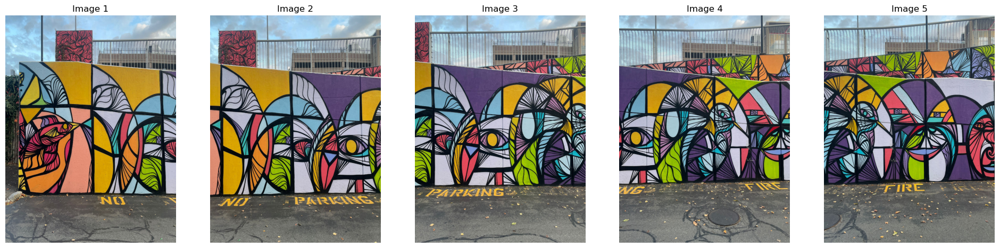

Stitching image 0 and 1...
Number of good matches between images: 758


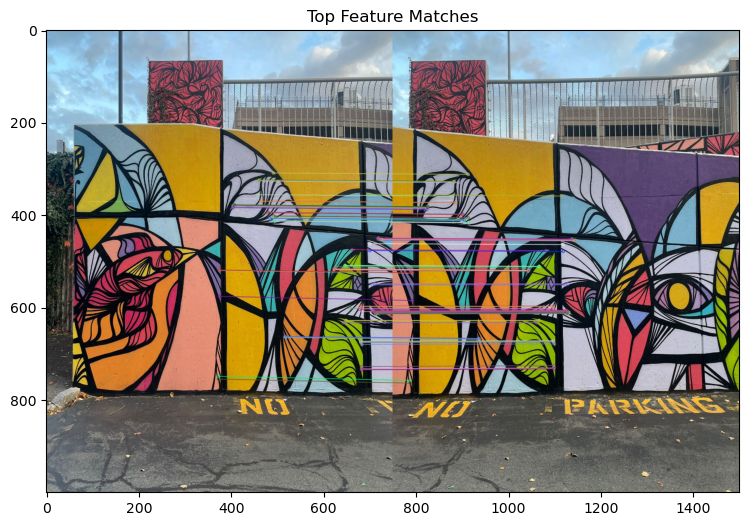

Stitching image 1 and 2...
Number of good matches between images: 1034


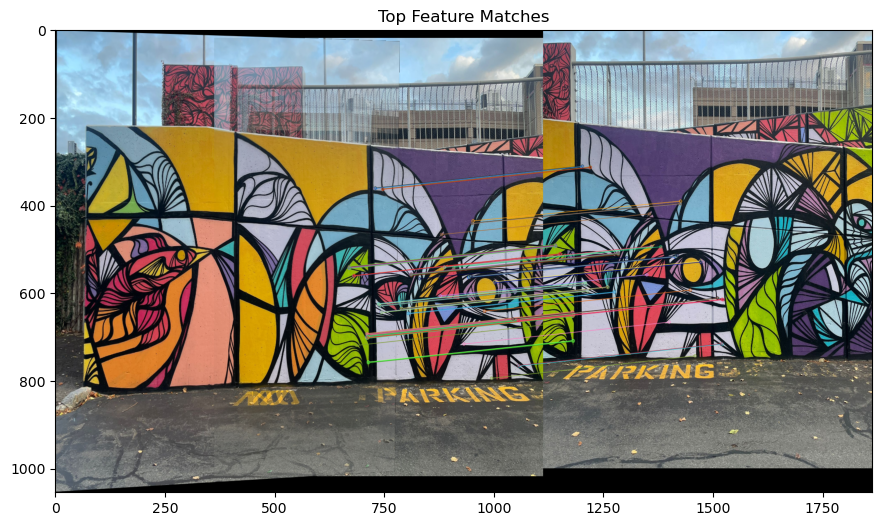

Stitching image 2 and 3...
Number of good matches between images: 1605


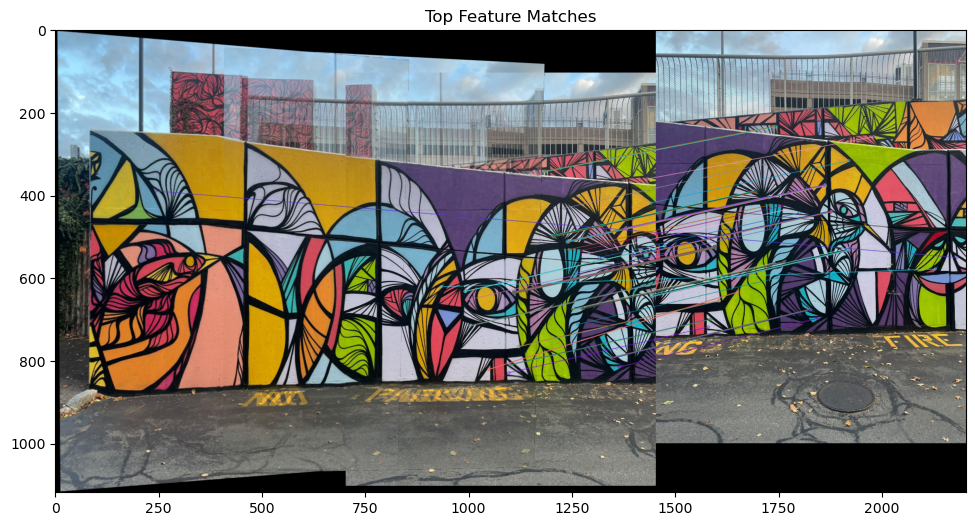

Stitching image 3 and 4...
Number of good matches between images: 1631


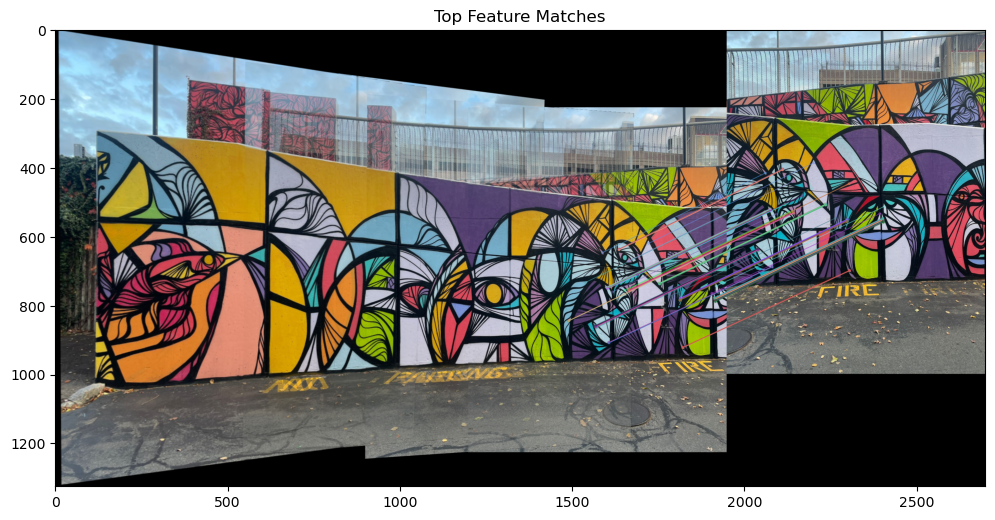

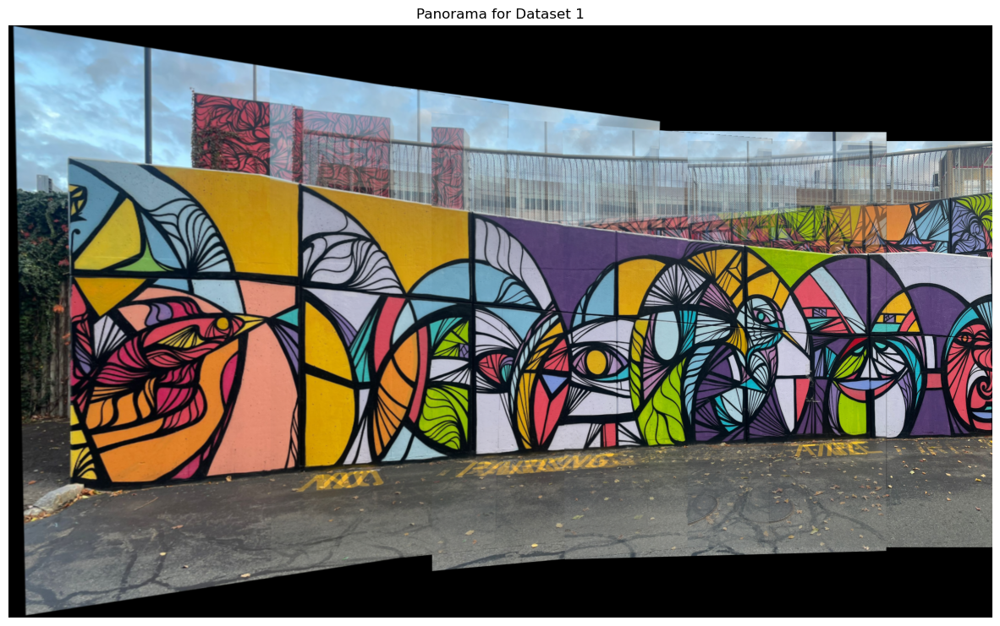


Processing Dataset 2
Images loaded successfully!


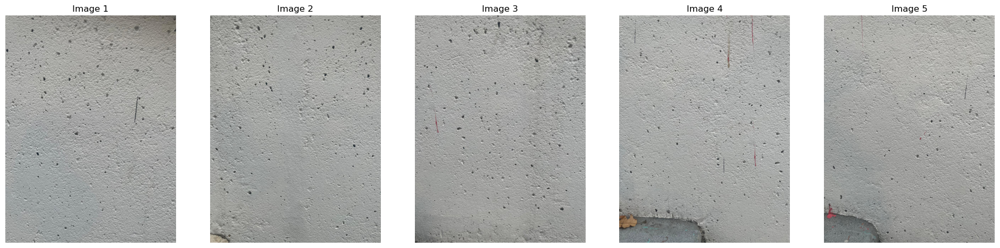

Stitching image 0 and 1...
Number of good matches between images: 95


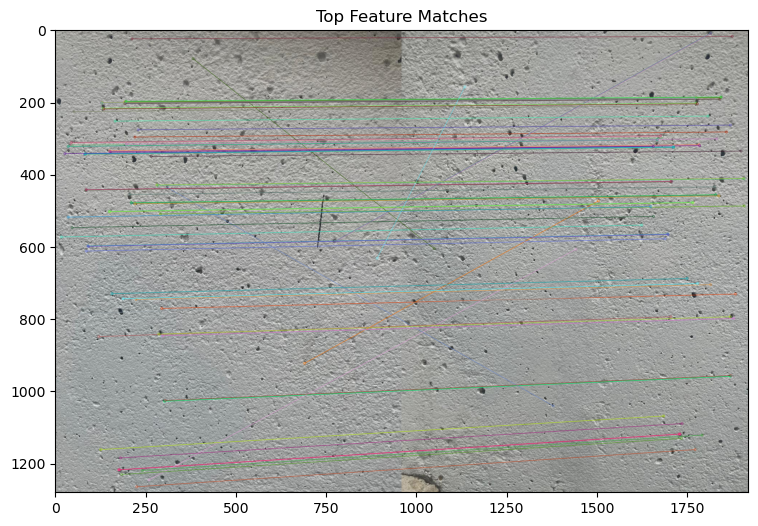

Stitching image 1 and 2...
Number of good matches between images: 206


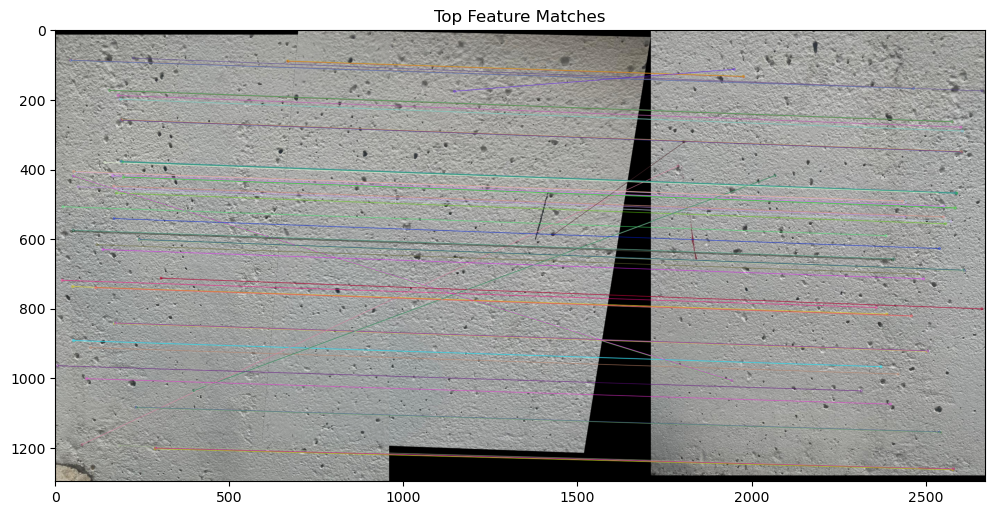

Stitching image 2 and 3...
Number of good matches between images: 87


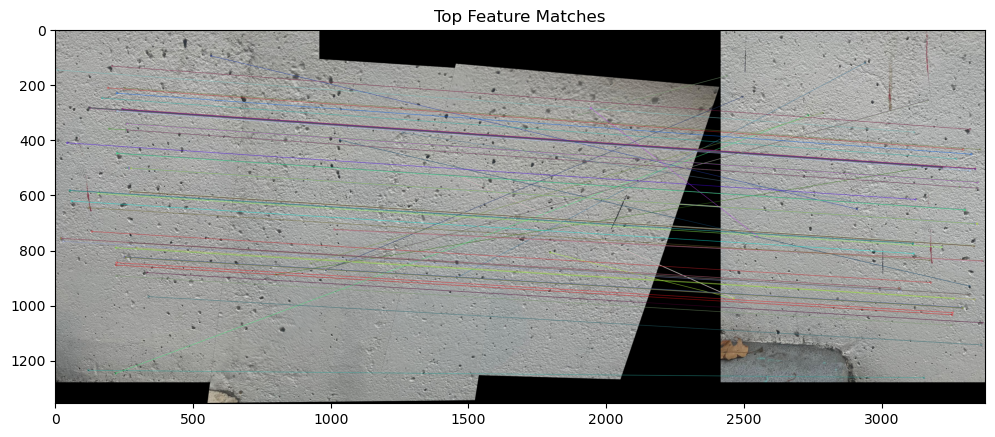

Stitching image 3 and 4...
Number of good matches between images: 52


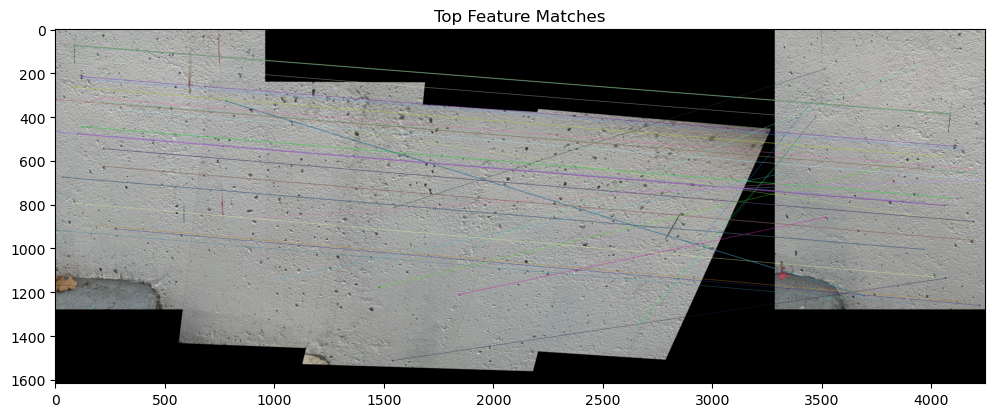

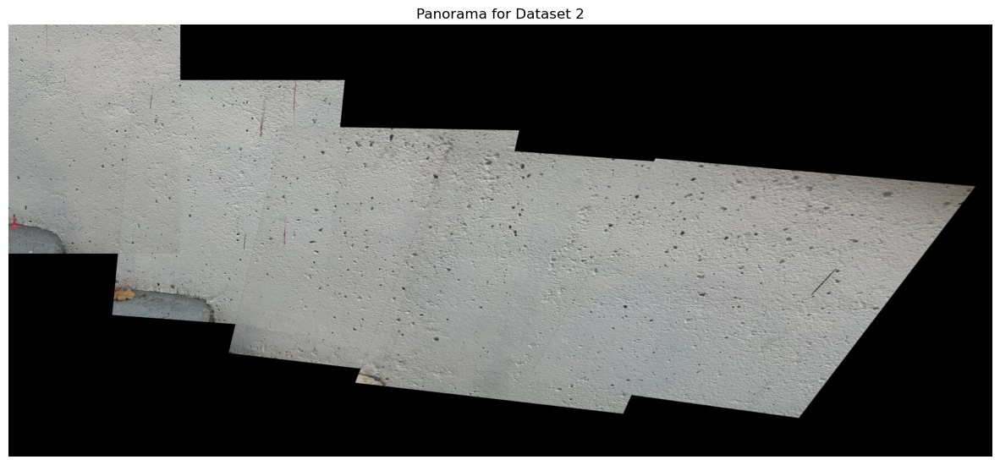


Processing Dataset 3
Images loaded successfully!


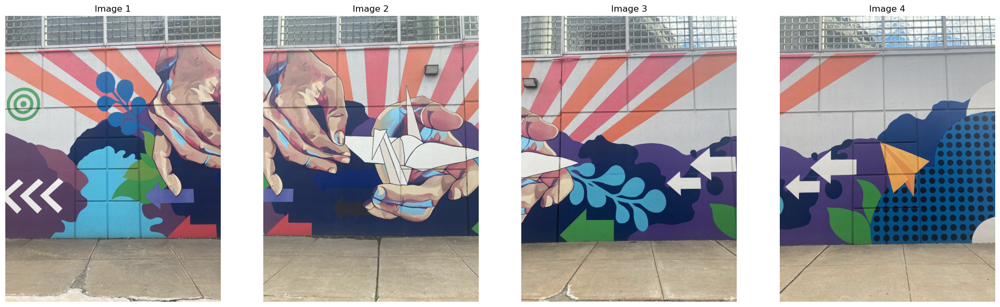

Stitching image 0 and 1...
Number of good matches between images: 123


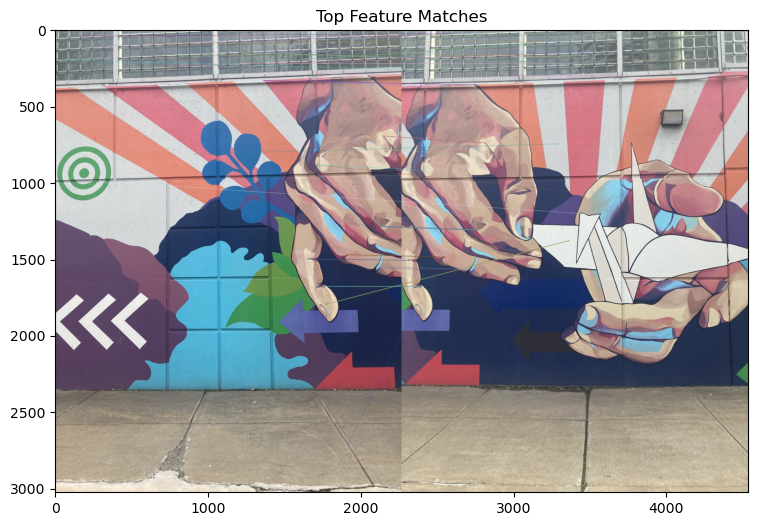

Stitching image 1 and 2...
Number of good matches between images: 114


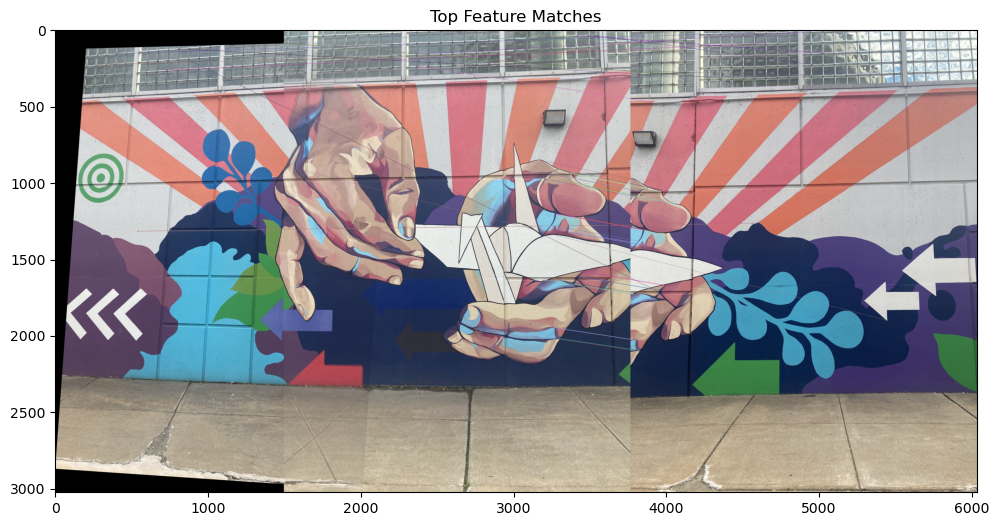

Stitching image 2 and 3...
Number of good matches between images: 72


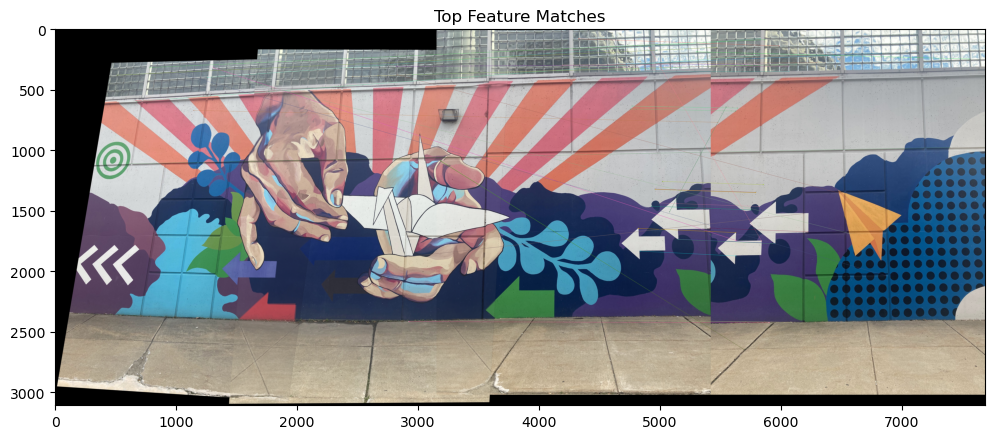

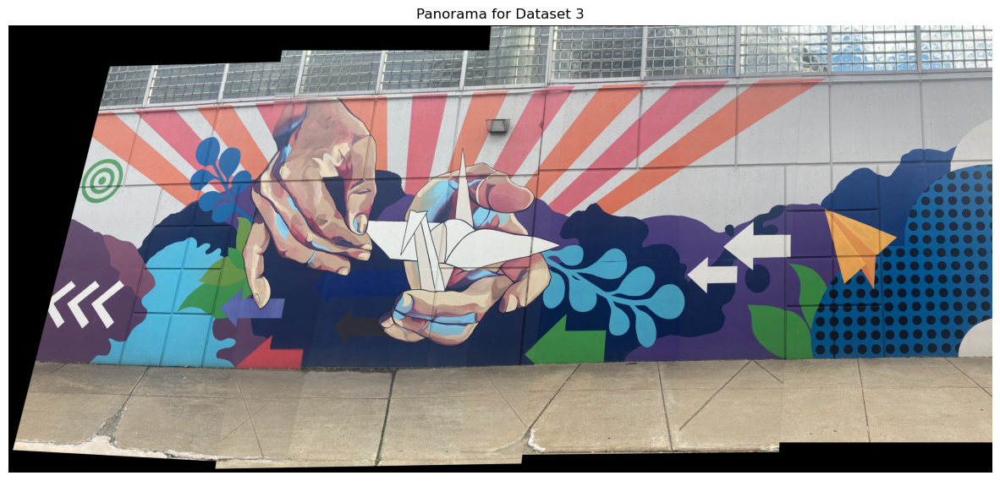

In [10]:
# Cell 10: Load images, create panorama, display, and save the result
dataset_paths = ['./images50', './wall50', './image15']  # Update these paths as needed  './images', './wall50', 

for i, path in enumerate(dataset_paths, 1):
    print(f"\nProcessing Dataset {i}")
    images = load_images(path)
    panorama = create_panorama(images)

    # Display the final panorama for each dataset
    plt.figure(figsize=(15, 10))
    plt.imshow(panorama)
    plt.title(f"Panorama for Dataset {i}")
    plt.axis("off")
    plt.show()
